In [1]:
import numpy as np # linear algebra
import re, os
import string
import pandas as pd
import seaborn as sns
import nltk
from nltk.corpus import stopwords
from wordcloud import WordCloud ,STOPWORDS
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics import accuracy_score, classification_report
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from nltk.tokenize import word_tokenize 
from nltk.stem import PorterStemmer, WordNetLemmatizer
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize, sent_tokenize
import gensim
from gensim.utils import simple_preprocess
from sklearn.svm import SVC
from gensim.parsing.preprocessing import STOPWORDS
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.feature_extraction.text import CountVectorizer
import warnings
warnings.filterwarnings("ignore")

In [56]:
df = pd.read_csv('Resume.csv')
df.head()

,ID,Resume_str,Resume_html,Category
0,16852973,HR ADMINISTRATOR/MARKETING ASSOCIATE\...,"<div class=""fontsize fontface vmargins hmargin...",HR
1,22323967,"HR SPECIALIST, US HR OPERATIONS ...","<div class=""fontsize fontface vmargins hmargin...",HR
2,33176873,HR DIRECTOR Summary Over 2...,"<div class=""fontsize fontface vmargins hmargin...",HR
3,27018550,HR SPECIALIST Summary Dedica...,"<div class=""fontsize fontface vmargins hmargin...",HR
4,17812897,HR MANAGER Skill Highlights ...,"<div class=""fontsize fontface vmargins hmargin...",HR


In [57]:
# drop not using columns
df.drop(columns = ['ID', 'Resume_html'], inplace = True)
df

,Resume_str,Category
0,HR ADMINISTRATOR/MARKETING ASSOCIATE\...,HR
1,"HR SPECIALIST, US HR OPERATIONS ...",HR
2,HR DIRECTOR Summary Over 2...,HR
3,HR SPECIALIST Summary Dedica...,HR
4,HR MANAGER Skill Highlights ...,HR
...,...,...
2479,RANK: SGT/E-5 NON- COMMISSIONED OFFIC...,AVIATION
2480,"GOVERNMENT RELATIONS, COMMUNICATIONS ...",AVIATION
2481,GEEK SQUAD AGENT Professional...,AVIATION
2482,PROGRAM DIRECTOR / OFFICE MANAGER ...,AVIATION


In [58]:
df.shape

(2484, 2)

In [59]:
df.isnull().sum()

Resume_str    0
Category      0
dtype: int64

In [60]:
df.dtypes

Resume_str    object
Category      object
dtype: object

In [61]:
print(np.unique(df['Category']))

['ACCOUNTANT' 'ADVOCATE' 'AGRICULTURE' 'APPAREL' 'ARTS' 'AUTOMOBILE'
 'AVIATION' 'BANKING' 'BPO' 'BUSINESS-DEVELOPMENT' 'CHEF' 'CONSTRUCTION'
 'CONSULTANT' 'DESIGNER' 'DIGITAL-MEDIA' 'ENGINEERING' 'FINANCE' 'FITNESS'
 'HEALTHCARE' 'HR' 'INFORMATION-TECHNOLOGY' 'PUBLIC-RELATIONS' 'SALES'
 'TEACHER']


In [62]:
# Get Unique Count using Series.unique()
count = df.Category.unique().size
print("Unique values count : "+ str(count))

Unique values count : 24


In [63]:
df['Category'].value_counts()

INFORMATION-TECHNOLOGY    120
BUSINESS-DEVELOPMENT      120
FINANCE                   118
ADVOCATE                  118
ACCOUNTANT                118
ENGINEERING               118
CHEF                      118
AVIATION                  117
FITNESS                   117
SALES                     116
BANKING                   115
HEALTHCARE                115
CONSULTANT                115
CONSTRUCTION              112
PUBLIC-RELATIONS          111
HR                        110
DESIGNER                  107
ARTS                      103
TEACHER                   102
APPAREL                    97
DIGITAL-MEDIA              96
AGRICULTURE                63
AUTOMOBILE                 36
BPO                        22
Name: Category, dtype: int64

In [64]:
# create list of all categories
categories = np.sort(df['Category'].unique())

In [65]:
print("\n__________\nRow 0 - Category : ", df.iloc[50].Category)
print("\n__________\nRow 0 - Resume_str : ", df.iloc[50].Resume_str)


__________
Row 0 - Category :  HR

__________
Row 0 - Resume_str :           HR ASSISTANT/PAYROLL         Highlights        Paychex, Mastertax, ABRA, Time Star, InfoTronics, Store Master, Dominion, QuickBooks
Ceridian, PeopleSoft, SAP, Microsoft Word, Excel and PowerPoint, Crystal Reports              Experience      HR Assistant/Payroll    Company Name   －   City  ,   State      Human Resources professional offering over 15 years of combined HR and payroll
          experience in both manufacturing and academic settings
Accurate and timely preparation of employee payroll, payroll tax information, and
          employee benefits administration
Highly effective employer representation in unemployment claims and hearings.         01/2014   to   01/2014     Payroll & Benefits Coordinator    Company Name   －   City  ,   State      Process weekly payroll for 100 hourly and salaried Associates
    Garnishment, Levy and Child Support processing
    Compile weekly labor hours      
    Enter 

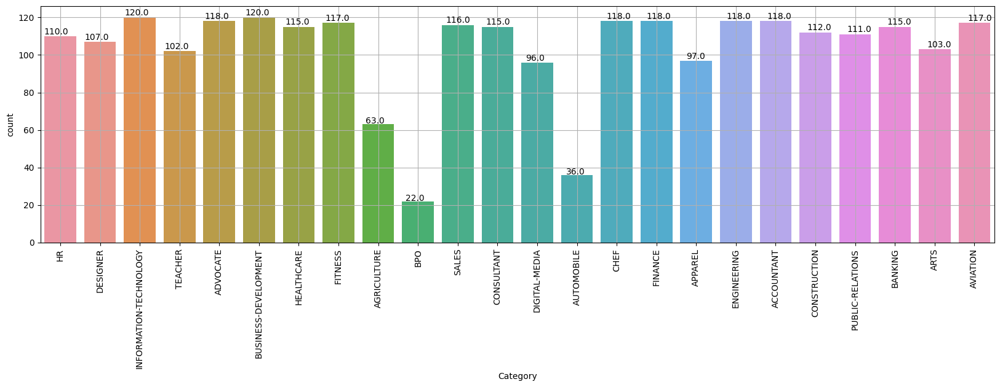

In [66]:
plt.figure(figsize=(20,5))
plt.xticks(rotation=90)
ax=sns.countplot(x="Category", data=df)
for p in ax.patches:
    ax.annotate(str(p.get_height()), (p.get_x() * 1.01 , p.get_height() * 1.01))
plt.grid()

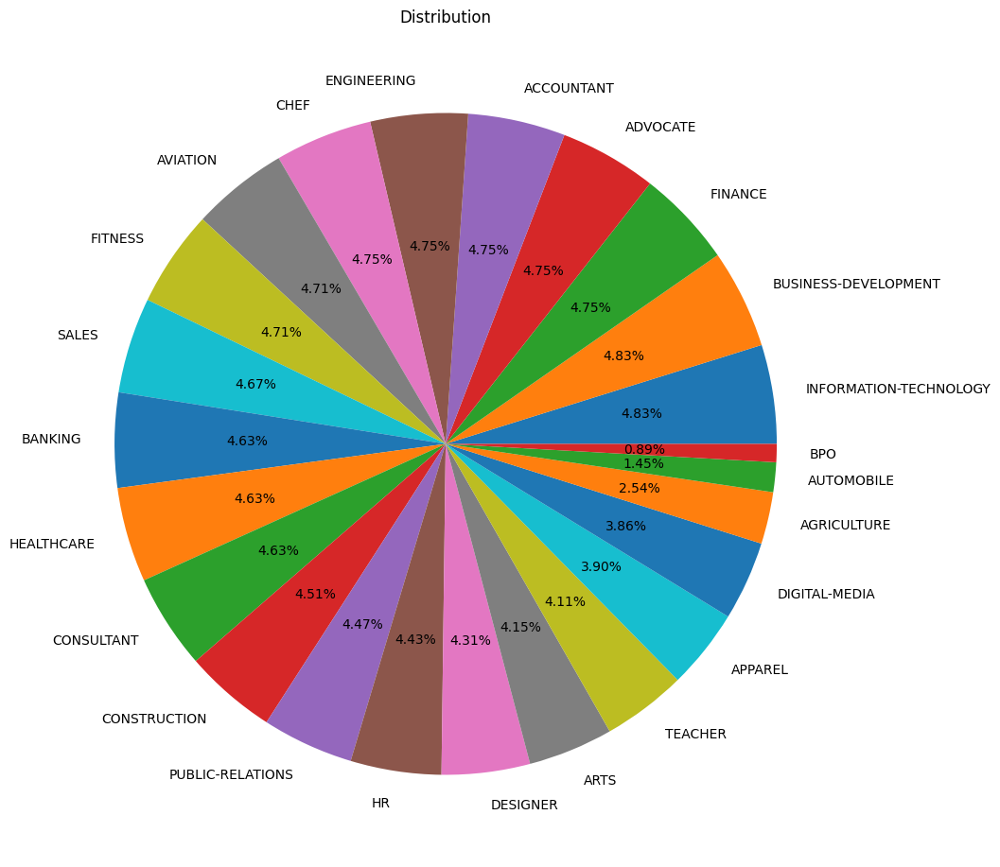

In [67]:
from matplotlib.gridspec import GridSpec
count=df['Category'].value_counts()
label=df['Category'].value_counts().keys()

plt.figure(1, figsize=(25,25))
grid=GridSpec(2,2)

cmap=plt.get_cmap('coolwarm')

color=[cmap(i) for i in np.linspace(0, 1, 5)]
plt.subplot(grid[0,1], aspect=1, title='Distribution')

pie=plt.pie(count, labels=label, autopct='%1.2f%%')
plt.show()

In [70]:
def cleanResume(resumeText):
    resumeText = re.sub('http\S+\s*', ' ', resumeText)  # remove URLs
    resumeText = re.sub('RT|cc', ' ', resumeText)  # remove RT and cc
    resumeText = re.sub('#\S+', '', resumeText)  # remove hashtags
    resumeText = re.sub('@\S+', '  ', resumeText)  # remove mentions
    resumeText = re.sub('[%s]' % re.escape("""!"#$%&'()*+,-./:;<=>?@[\]^_`{|}~"""), ' ', resumeText)  # remove punctuations
    resumeText = re.sub(r'[^\x00-\x7f]',r' ', resumeText) 
    resumeText = re.sub('\s+', ' ', resumeText)  # remove extra whitespace
    resumeText = resumeText.lower() # lowercase text
    BAD_SYMBOLS_RE = re.compile('[^0-9a-z #+_]')
    resumeText = BAD_SYMBOLS_RE.sub('', resumeText) # remove symbols which are in BAD_SYMBOLS_RE from text. substitute the matched string in BAD_SYMBOLS_RE with nothing.
    return resumeText

In [71]:
oneSetOfStopWords = set(stopwords.words('english')+["-",'``',"''"])
totalWords =[]
Sentences = df['Resume_str'].values
cleanedSentences = ""
for i in range(0,2484):
    cleanedText = cleanResume(Sentences[i])
    cleanedSentences += cleanedText
    requiredWords = nltk.word_tokenize(cleanedText)
    for word in requiredWords:
        if word not in oneSetOfStopWords and word not in string.punctuation:
            totalWords.append(word)
    
wordfreqdist = nltk.FreqDist(totalWords)
mostcommon = wordfreqdist.most_common(50)
print(mostcommon)

[('state', 16156), ('company', 15212), ('city', 15077), ('management', 12174), ('name', 11739), ('sales', 8275), ('customer', 7927), ('business', 7866), ('skills', 7729), ('new', 6407), ('service', 6223), ('team', 6073), ('development', 5731), ('training', 5637), ('experience', 5632), ('project', 5362), ('work', 4817), ('manager', 4534), ('information', 4502), ('marketing', 4489), ('financial', 4227), ('office', 4186), ('education', 4093), ('support', 4076), ('including', 4045), ('staff', 3949), ('professional', 3857), ('data', 3797), ('system', 3697), ('systems', 3559), ('university', 3477), ('managed', 3431), ('process', 3428), ('customers', 3418), ('design', 3383), ('quality', 3367), ('client', 3272), ('clients', 3244), ('developed', 3228), ('reports', 3083), ('analysis', 3052), ('operations', 3008), ('product', 2951), ('high', 2950), ('program', 2934), ('services', 2847), ('microsoft', 2830), ('ounting', 2829), ('01', 2793), ('2014', 2792)]


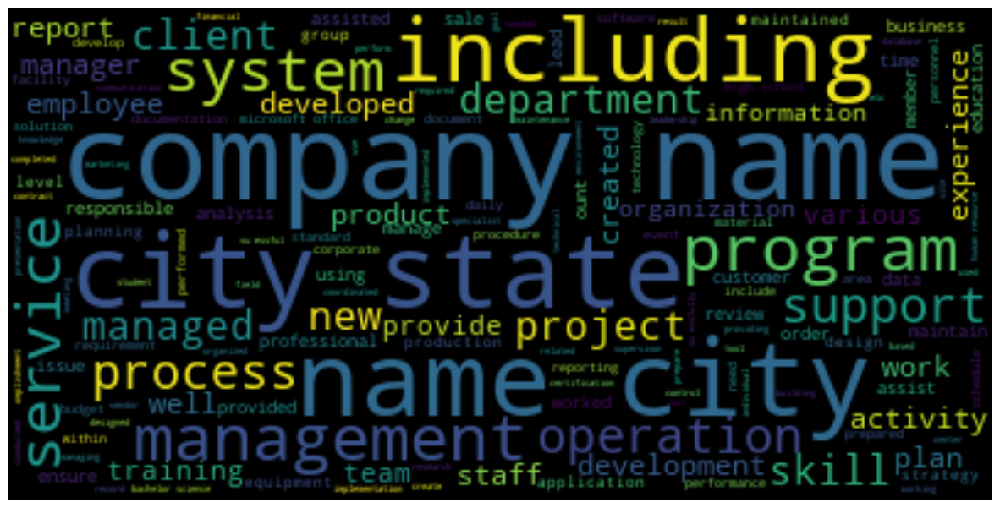

In [88]:
wc = WordCloud().generate(cleanedSentences)
plt.figure(figsize=(15,15))
plt.imshow(wc, interpolation='bilinear')
plt.axis("off")
plt.show()

Text(0.5, 1.0, 'Resume length distribution')

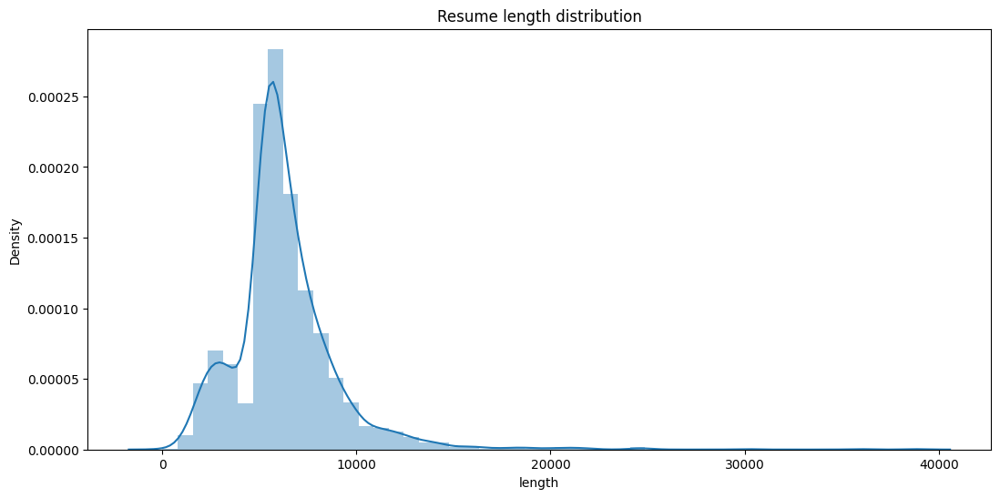

In [73]:
df['length'] = df['Resume_str'].str.len()
plt.figure(figsize=(12.8,6))
sns.distplot(df['length']).set_title('Resume length distribution')

In [74]:
df['length'].describe()

count     2484.000000
mean      6295.308776
std       2769.251458
min         21.000000
25%       5160.000000
50%       5886.500000
75%       7227.250000
max      38842.000000
Name: length, dtype: float64

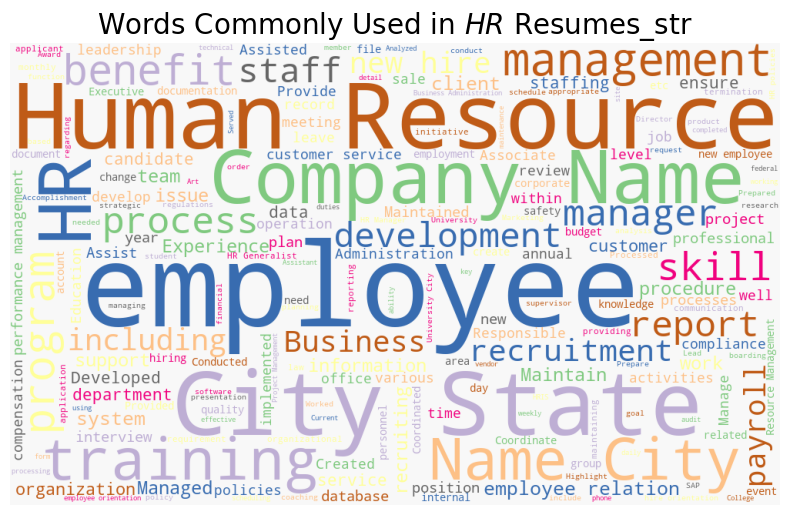

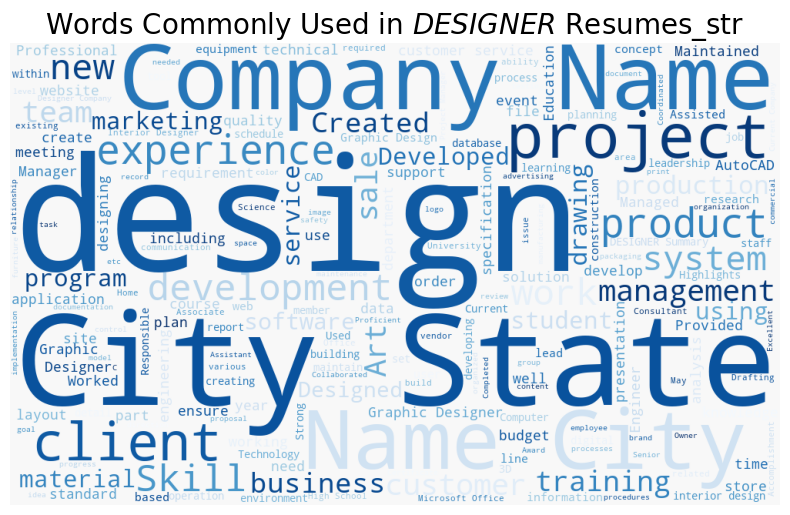

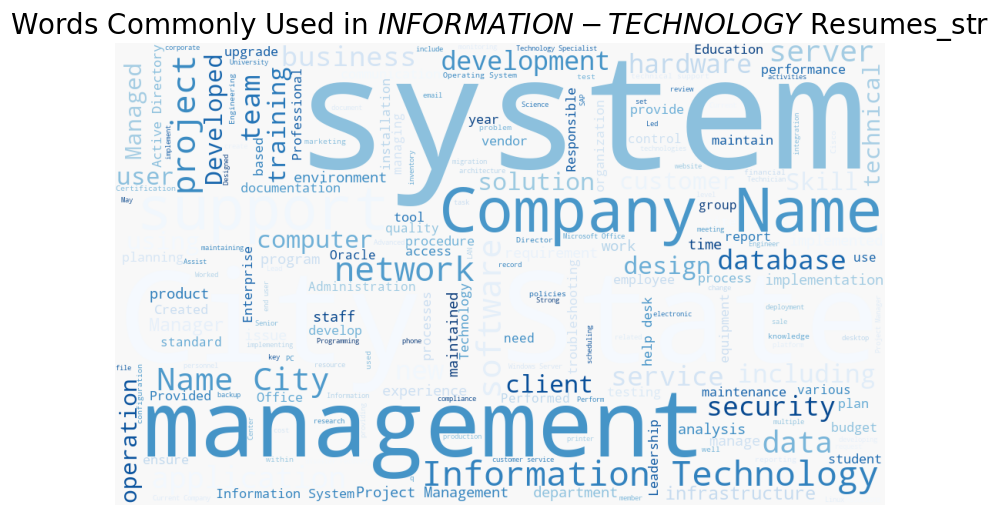

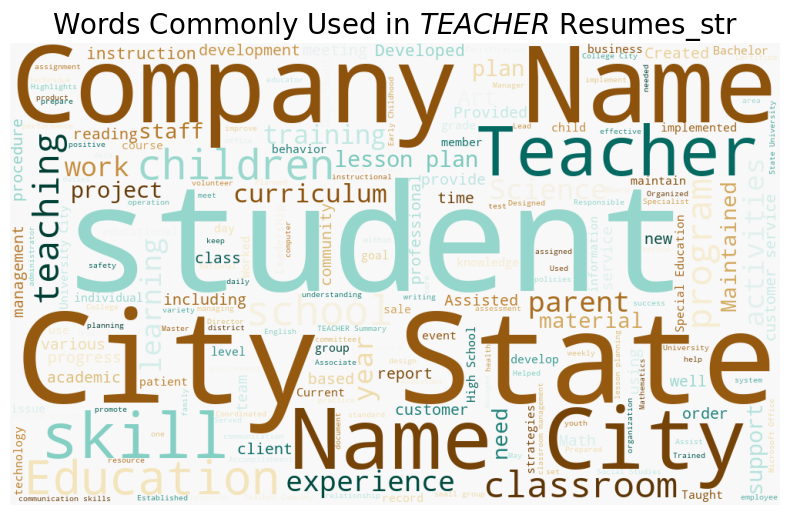

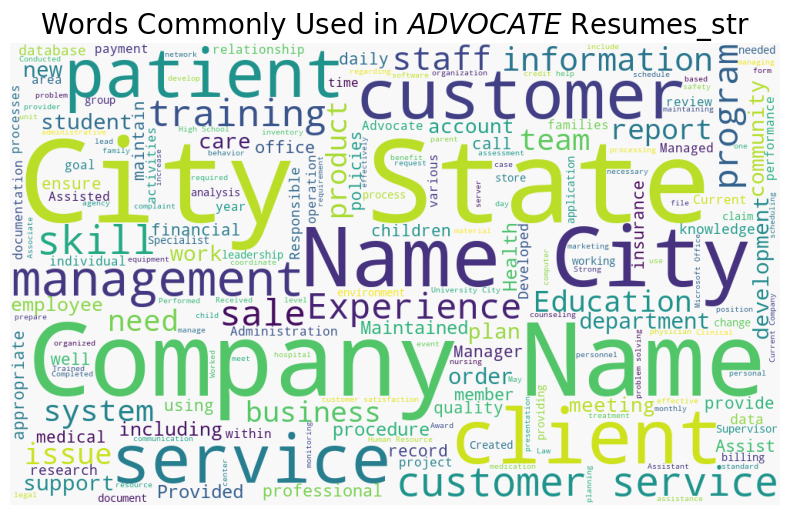

...

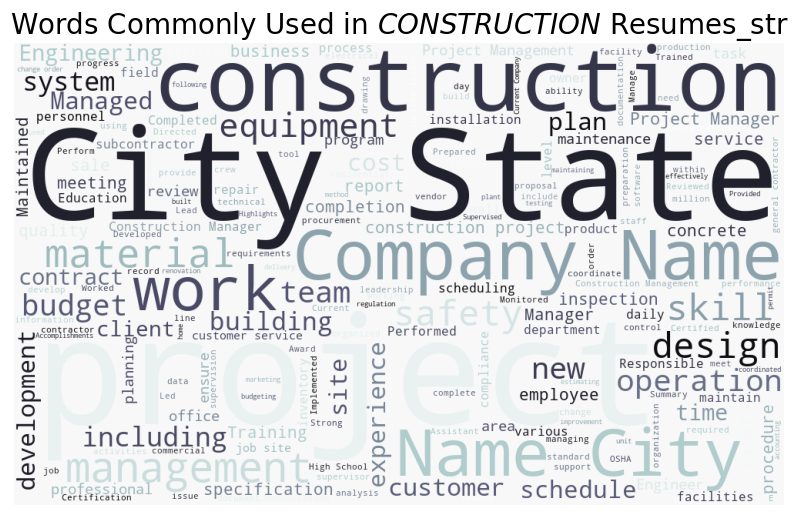

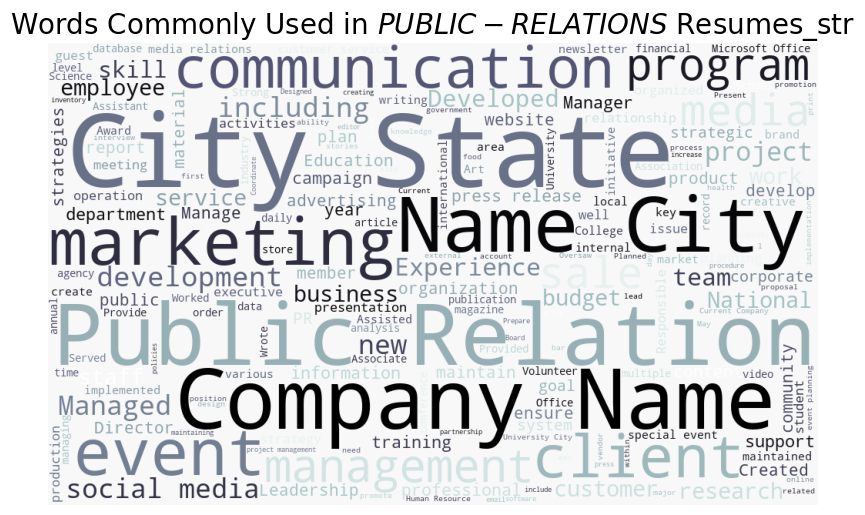

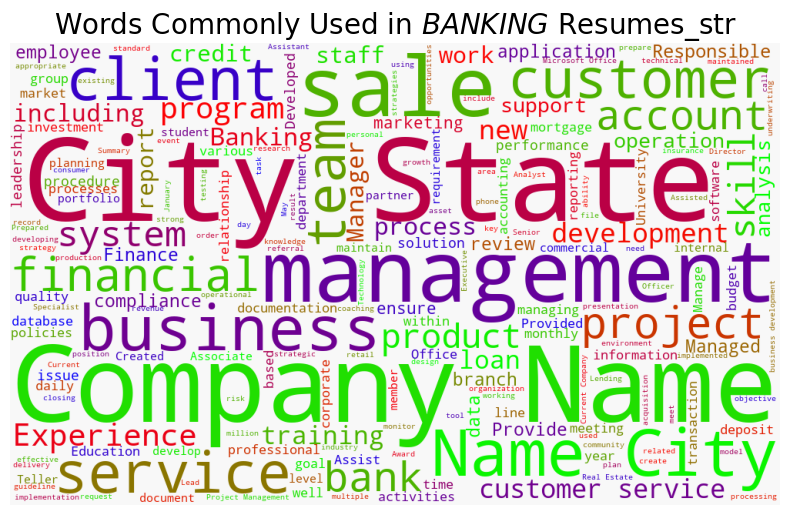

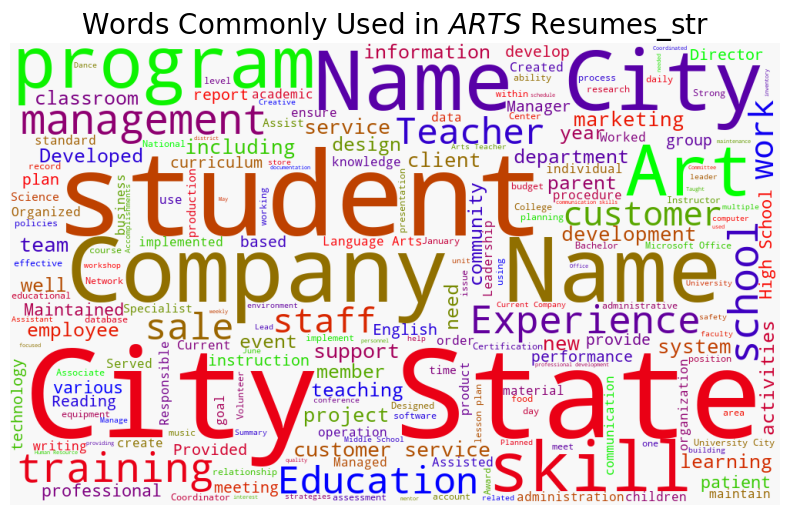

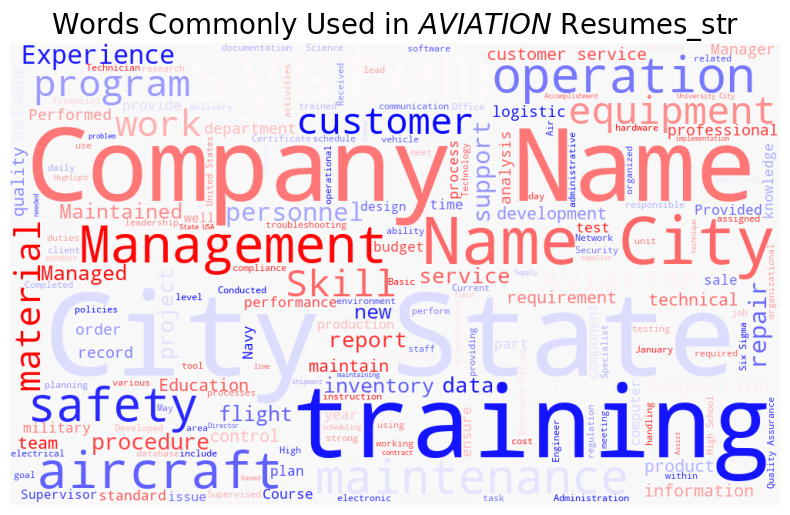

In [75]:
a=[ 'Accent_r', 'Blues', 'Blues_r', 'BrBG', 'viridis', 'viridis_r', 'vlag', 'vlag_r', 'winter', 'winter_r','BrBG_r', 'BuGn', 'BuGn_r', 'afmhot', 'afmhot_r', 'autumn', 'autumn_r', 'binary', 'binary_r', 'bone', 'bone_r', 'brg', 'brg_r', 'bwr', 'crest_r']
for label, cmap in zip(df['Category'].unique(), a):
    text = df.query("Category == @label")["Resume_str"].str.cat(sep=" ")
    plt.figure(figsize=(10, 6))
    wc = WordCloud(width=1000, height=600, background_color="#f8f8f8", colormap=cmap)
    wc.generate_from_text(text)
    plt.imshow(wc)
    plt.axis("off")
    plt.title(f"Words Commonly Used in ${label}$ Resumes_str", size=20)
    plt.show()

In [76]:
#Feature Engineering
#Removing Punctuations and Stopwords
#Removing the special characters

REPLACE_BY_SPACE_RE = re.compile('[/(){}\[\]\|@,;]')
BAD_SYMBOLS_RE = re.compile('[^0-9a-z #+_]')
STOPWORDS = set(stopwords.words('english'))

def clean_text(text):
    """
        text: a string
        
        return: modified initial string
    """
    
    text = text.lower() # lowercase text
    text = REPLACE_BY_SPACE_RE.sub(' ', text) # replace REPLACE_BY_SPACE_RE symbols by space in text. substitute the matched string in REPLACE_BY_SPACE_RE with space.
    text = BAD_SYMBOLS_RE.sub('', text) # remove symbols which are in BAD_SYMBOLS_RE from text. substitute the matched string in BAD_SYMBOLS_RE with nothing. 
    
    text = ' '.join(word for word in text.split() if word not in STOPWORDS) # remove stopwors from text
    return text


    
def cleanResume(resumeText):
    resumeText = re.sub('http\S+\s*', ' ', resumeText)  # remove URLs
    resumeText = re.sub('RT|cc', ' ', resumeText)  # remove RT and cc
    resumeText = re.sub('#\S+', '', resumeText)  # remove hashtags
    resumeText = re.sub('@\S+', '  ', resumeText)  # remove mentions
    resumeText = re.sub('[%s]' % re.escape("""!"#$%&'()*+,-./:;<=>?@[\]^_`{|}~"""), ' ', resumeText)  # remove punctuations
    resumeText = re.sub(r'[^\x00-\x7f]',r' ', resumeText) 
    resumeText = re.sub('\s+', ' ', resumeText)  # remove extra whitespace
   


    

    return resumeText


STEMMER = nltk.stem.porter.PorterStemmer()
def preprocess(txt):
    # remove non-english characters, punctuation and numbers
    txt = re.sub('[^a-zA-Z]', ' ', txt)
    # tokenize word
    txt = nltk.tokenize.word_tokenize(txt)
    # remove stop words
    txt = [w for w in txt if not w in nltk.corpus.stopwords.words('english')]
    # Lemmatize the words
    lemmatizer = WordNetLemmatizer()
    txt = [lemmatizer.lemmatize(txt) for txt in txt]

    return ' '.join(txt)

In [77]:
df['Resume_Clean'] = df['Resume_str'].apply(clean_text)
df['Resume_Clean'] = df['Resume_Clean'].apply(cleanResume)
df['Resume_Clean'] = df['Resume_Clean'].apply(preprocess)
df['Resume_Clean'] = df['Resume_Clean'].str.replace('\d+', '')
df.head()

,Resume_str,Category,length,Resume_Clean
0,HR ADMINISTRATOR/MARKETING ASSOCIATE\...,HR,5442,hr administrator marketing associatehr adminis...
1,"HR SPECIALIST, US HR OPERATIONS ...",HR,5572,hr specialist u hr operation summary versatile...
2,HR DIRECTOR Summary Over 2...,HR,7720,hr director summary year experience recruiting...
3,HR SPECIALIST Summary Dedica...,HR,2855,hr specialist summary dedicated driven dynamic...
4,HR MANAGER Skill Highlights ...,HR,9172,hr manager skill highlight hr skill hr departm...


In [78]:
oneSetOfStopWords = set(stopwords.words('english')+["-",'``',"''"])
totalWords =[]
Sentences = df['Resume_str'].values
cleanedSentences = ""
for i in range(0,2484):
    cleanedText = cleanResume(Sentences[i])
    cleanedSentences += cleanedText
    requiredWords = nltk.word_tokenize(cleanedText)
    for word in requiredWords:
        if word not in oneSetOfStopWords and word not in string.punctuation:
            totalWords.append(word)
    
wordfreqdist = nltk.FreqDist(totalWords)
mostcommon = wordfreqdist.most_common(50)
print(mostcommon)

[('State', 15351), ('City', 14960), ('Company', 11932), ('Name', 11653), ('A', 7200), ('management', 7011), ('customer', 6156), ('sales', 5645), ('new', 5518), ('Management', 5085), ('team', 4728), ('I', 4710), ('business', 4462), ('service', 4427), ('skills', 4188), ('including', 4003), ('development', 3845), ('training', 3798), ('work', 3514), ('Skills', 3491), ('staff', 3406), ('customers', 3356), ('Education', 3355), ('Manager', 3288), ('company', 3273), ('support', 3223), ('Business', 3183), ('University', 3157), ('financial', 3084), ('project', 3044), ('clients', 3014), ('Experience', 2876), ('data', 2867), ('reports', 2855), ('marketing', 2836), ('ounting', 2829), ('Microsoft', 2811), ('01', 2793), ('2014', 2792), ('ounts', 2769), ('process', 2733), ('experience', 2731), ('client', 2694), ('system', 2669), ('information', 2631), ('2013', 2554), ('quality', 2537), ('systems', 2477), ('Office', 2459), ('procedures', 2415)]


In [79]:
oneSetOfStopWords = set(stopwords.words('english')+["-",'``',"''"])
totalWords =[]
Sentences = df['Resume_Clean'].values
cleanedSentences = ""
for i in range(0,2484):
    cleanedText = cleanResume(Sentences[i])
    cleanedSentences += cleanedText
    requiredWords = nltk.word_tokenize(cleanedText)
    for word in requiredWords:
        if word not in oneSetOfStopWords and word not in string.punctuation:
            totalWords.append(word)
    
wordfreqdist = nltk.FreqDist(totalWords)
mostcommon = wordfreqdist.most_common(50)
print(mostcommon)

[('state', 16710), ('company', 15551), ('city', 15108), ('management', 11961), ('name', 11738), ('customer', 11101), ('service', 8771), ('sale', 8438), ('skill', 8076), ('business', 7922), ('project', 7762), ('system', 7137), ('team', 6897), ('client', 6364), ('new', 6308), ('development', 5737), ('experience', 5716), ('training', 5671), ('manager', 5500), ('process', 5110), ('work', 5097), ('program', 4933), ('product', 4809), ('information', 4451), ('marketing', 4435), ('office', 4359), ('employee', 4309), ('financial', 4199), ('support', 4165), ('professional', 4145), ('education', 4086), ('including', 4013), ('staff', 3933), ('report', 3846), ('data', 3733), ('communication', 3694), ('operation', 3672), ('design', 3601), ('university', 3463), ('student', 3431), ('year', 3401), ('managed', 3368), ('plan', 3365), ('quality', 3274), ('developed', 3144), ('analysis', 3103), ('member', 3002), ('budget', 2875), ('ounting', 2829), ('department', 2814)]


Text(0.5, 1.0, 'Resume length distribution')

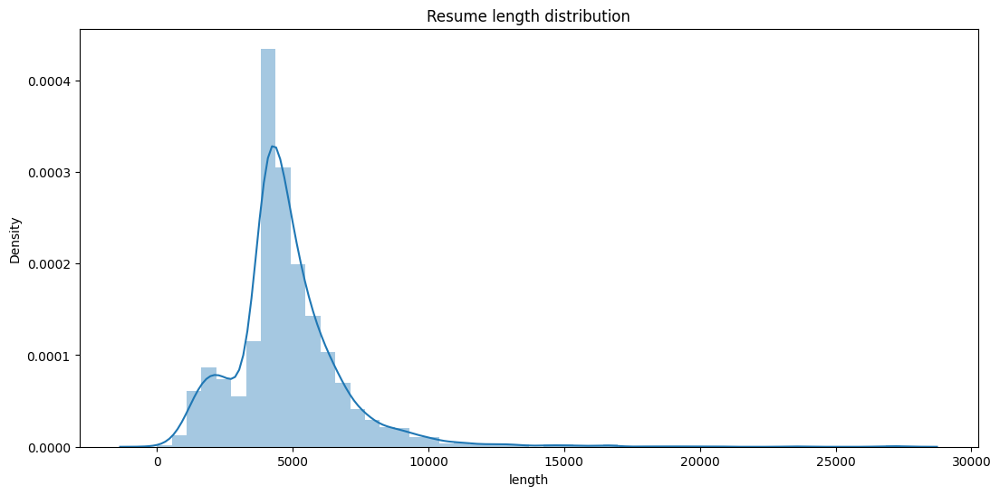

In [80]:
df['length'] = df['Resume_Clean'].str.len()
plt.figure(figsize=(12.8,6))
sns.distplot(df['length']).set_title('Resume length distribution')

In [81]:
df['length'].describe()

count     2484.000000
mean      4798.278986
std       2149.631752
min          0.000000
25%       3902.750000
50%       4496.500000
75%       5558.000000
max      27381.000000
Name: length, dtype: float64

In [89]:
from sklearn.feature_extraction import text
REPLACE_BY_SPACE_RE = re.compile('[/(){}\[\]\|@,;]')
BAD_SYMBOLS_RE = re.compile('[^0-9a-z #+_]')
STOPWORDS = text.ENGLISH_STOP_WORDS.union( ['state', 'city',
     'company', 'name', 'skill'])

def clean_text(text):
    """
        text: a string
        
        return: modified initial string
    """
    
    text = text.lower() # lowercase text
    text = REPLACE_BY_SPACE_RE.sub(' ', text) # replace REPLACE_BY_SPACE_RE symbols by space in text. substitute the matched string in REPLACE_BY_SPACE_RE with space.
    text = BAD_SYMBOLS_RE.sub('', text) # remove symbols which are in BAD_SYMBOLS_RE from text. substitute the matched string in BAD_SYMBOLS_RE with nothing. 
    
    text = ' '.join(word for word in text.split() if word not in STOPWORDS) # remove stopwors from text
    return text

In [93]:
df['Resume_filtered'] = df['Resume_Clean'].apply(lambda w: clean_text(w))


In [94]:
oneSetOfStopWords = set(stopwords.words('english')+["-",'``',"''"])
totalWords =[]
Sentences = df['Resume_Clean'].values
cleanedSentences = ""
for i in range(0,2484):
    cleanedText = cleanResume(Sentences[i])
    cleanedSentences += cleanedText
    requiredWords = nltk.word_tokenize(cleanedText)
    for word in requiredWords:
        if word not in oneSetOfStopWords and word not in string.punctuation:
            totalWords.append(word)
    
wordfreqdist = nltk.FreqDist(totalWords)
mostcommon = wordfreqdist.most_common(50)
print(mostcommon)

[('state', 16710), ('company', 15551), ('city', 15108), ('management', 11961), ('name', 11738), ('customer', 11101), ('service', 8771), ('sale', 8438), ('skill', 8076), ('business', 7922), ('project', 7762), ('system', 7137), ('team', 6897), ('client', 6364), ('new', 6308), ('development', 5737), ('experience', 5716), ('training', 5671), ('manager', 5500), ('process', 5110), ('work', 5097), ('program', 4933), ('product', 4809), ('information', 4451), ('marketing', 4435), ('office', 4359), ('employee', 4309), ('financial', 4199), ('support', 4165), ('professional', 4145), ('education', 4086), ('including', 4013), ('staff', 3933), ('report', 3846), ('data', 3733), ('communication', 3694), ('operation', 3672), ('design', 3601), ('university', 3463), ('student', 3431), ('year', 3401), ('managed', 3368), ('plan', 3365), ('quality', 3274), ('developed', 3144), ('analysis', 3103), ('member', 3002), ('budget', 2875), ('ounting', 2829), ('department', 2814)]


In [96]:
oneSetOfStopWords = set(stopwords.words('english')+["-",'``',"''"])
totalWords =[]
Sentences = df['Resume_filtered'].values
cleanedSentences = ""
for i in range(0,2484):
    cleanedText = cleanResume(Sentences[i])
    cleanedSentences += cleanedText
    requiredWords = nltk.word_tokenize(cleanedText)
    for word in requiredWords:
        if word not in oneSetOfStopWords and word not in string.punctuation:
            totalWords.append(word)
    
wordfreqdist = nltk.FreqDist(totalWords)
mostcommon = wordfreqdist.most_common(100)
print(mostcommon)

[('management', 11961), ('customer', 11101), ('service', 8771), ('sale', 8438), ('business', 7922), ('project', 7762), ('team', 6897), ('client', 6364), ('new', 6308), ('development', 5737), ('experience', 5716), ('training', 5671), ('manager', 5500), ('process', 5110), ('work', 5097), ('program', 4933), ('product', 4809), ('information', 4451), ('marketing', 4435), ('office', 4359), ('employee', 4309), ('financial', 4199), ('support', 4165), ('professional', 4145), ('education', 4086), ('including', 4013), ('staff', 3933), ('report', 3846), ('data', 3733), ('communication', 3694), ('operation', 3672), ('design', 3601), ('university', 3463), ('student', 3431), ('year', 3401), ('managed', 3368), ('plan', 3365), ('quality', 3274), ('developed', 3144), ('analysis', 3103), ('member', 3002), ('budget', 2875), ('ounting', 2829), ('department', 2814), ('microsoft', 2785), ('current', 2766), ('ounts', 2760), ('procedure', 2732), ('responsible', 2696), ('maintained', 2694), ('school', 2646), ('

Text(0.5, 1.0, 'Word Cloud of Resumes')

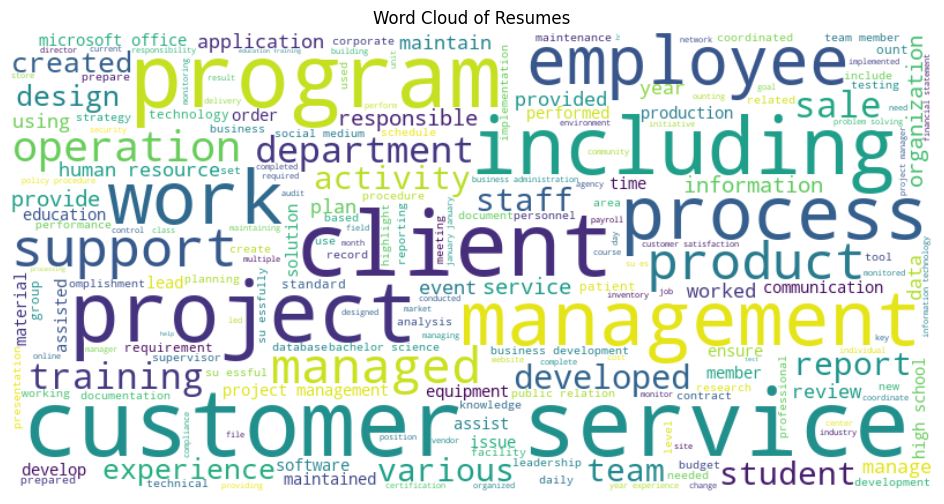

In [97]:
# Create a word cloud of the 'Resume_filtered' column
from wordcloud import WordCloud
skills = ' '.join(df['Resume_filtered'].tolist())
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(skills)
plt.figure(figsize=(12,6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Word Cloud of Resumes')

In [98]:
#Encode the labels into numeric

def set_code(row):
    if row["Category"] == "ACCOUNTANT":
        return 1
    elif row["Category"] == "ADVOCATE":
        return 2
    elif row["Category"] == "AGRICULTURE":
        return 3
    elif row["Category"] == "APPAREL":
        return 4
    elif row["Category"] == "ARTS":
        return 5
    elif row["Category"] == "AUTOMOBILE":
        return 6
    elif row["Category"] == "AVIATION":
        return 7
    elif row["Category"] == "BANKING":
        return 8
    elif row["Category"] == "BPO":
        return 9
    elif row["Category"] == "BUSINESS-DEVELOPMENT":
        return 10
    elif row["Category"] == "CHEF":
        return 11
    elif row["Category"] == "CONSTRUCTION":
        return 12
    elif row["Category"] == "CONSULTANT":
        return 13
    elif row["Category"] == "DESIGNER":
        return 14
    elif row["Category"] == "DIGITAL-MEDIA":
        return 15
    elif row["Category"] == "ENGINEERING":
        return 16
    elif row["Category"] == "FINANCE":
        return 17
    elif row["Category"] == "HEALTHCARE":
        return 18
    elif row["Category"] == "HR":
        return 19
    elif row["Category"] == "INFORMATION-TECHNOLOGY":
        return 20
    elif row["Category"] == "PUBLIC-RELATIONS":
        return 21
    elif row["Category"] == "SALES":
        return 22
    elif row["Category"] == "TEACHER":
        return 23
    else:
        return 24

df = df.assign(target=df.apply(set_code, axis=1))

print(df.head())

                                          Resume_str Category  length  \
0           HR ADMINISTRATOR/MARKETING ASSOCIATE\...       HR    4153   
1           HR SPECIALIST, US HR OPERATIONS      ...       HR    4313   
2           HR DIRECTOR       Summary      Over 2...       HR    5820   
3           HR SPECIALIST       Summary    Dedica...       HR    2104   
4           HR MANAGER         Skill Highlights  ...       HR    7194   

                                        Resume_Clean  \
0  hr administrator marketing associatehr adminis...   
1  hr specialist u hr operation summary versatile...   
2  hr director summary year experience recruiting...   
3  hr specialist summary dedicated driven dynamic...   
4  hr manager skill highlight hr skill hr departm...   

                                     Resume_filtered  target  
0  hr administrator marketing associatehr adminis...      19  
1  hr specialist u hr operation summary versatile...      19  
2  hr director summary year experie

In [100]:
def upsample_classes(data, target):
    
    lst = list(data[target].unique())
    
    classes = []
    for c in lst:
        classes.append(data[data[target]==c])
    
    length = 0
    class_lab = None
    for c in classes:
        if len(c)>length:
            length=len(c)
            class_lab = c
    class_lab = class_lab[target].unique()[0]
    
    regroup = pd.concat(classes)
    maj_class = regroup[regroup[target]==class_lab]

    lst.remove(class_lab)
    
    new_classes=[]
    for i in lst:
        new_classes.append(resample(data[data[target]==i],replace=True, n_samples=len(maj_class)))

    minority_classes = pd.concat(new_classes)
    upsample = pd.concat([regroup[regroup[target]==class_lab],minority_classes])

    return upsample

In [109]:
from sklearn.utils import resample
df_balanced = (upsample_classes(df,'target'))

In [110]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(df_balanced['Resume_filtered'], df_balanced['target'], test_size = 0.2, random_state=8)

In [ ]:
#Tfidf

In [135]:
Tfidf_vect = TfidfVectorizer(max_features=33600)
Tfidf_vect.fit(df['Resume_filtered'])
Train_X_Tfidf = Tfidf_vect.transform(X_train)
Test_X_Tfidf = Tfidf_vect.transform(X_test)

In [136]:
Train_X_Tfidf.shape

(2304, 33600)

In [146]:
# Classifier - Algorithm - SVM
from sklearn.svm import SVC
from sklearn.svm import LinearSVC
from sklearn import svm
# fit the training dataset on the classifier
SVM = OneVsRestClassifier(svm.SVC(C=5.0, kernel='linear', degree=3, gamma='auto'))
SVM.fit(Train_X_Tfidf,y_train)
# predict the labels on validation dataset
predictions_SVM = SVM.predict(Test_X_Tfidf)
# Use accuracy_score function to get the accuracy
print("SVM Accuracy Score -> ",accuracy_score(predictions_SVM, y_test)*100)

SVM Accuracy Score ->  85.9375


In [115]:
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfVectorizer
from scipy.sparse import hstack

In [116]:
Text= df['Resume_filtered'].values
Target= df['target'].values

In [117]:
word_vectorizer = TfidfVectorizer(sublinear_tf=True, stop_words='english')
word_vectorizer.fit(Text)
WordFeatures= word_vectorizer.transform(Text)

In [118]:
WordFeatures.shape

(2484, 45102)

In [119]:
X_train,X_test,y_train,y_test= train_test_split(WordFeatures, Target, random_state=42)

In [120]:
print(X_train.shape)
print(X_test.shape)

(1863, 45102)
(621, 45102)


In [122]:
from sklearn.multiclass import OneVsRestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.naive_bayes import MultinomialNB
from sklearn.tree import DecisionTreeClassifier

In [123]:
models = {
    'K-Nearest Neighbors' : KNeighborsClassifier(),
    'Logistic Regression' : LogisticRegression(),
    'Support Vector Machine' : SVC(),
    'Random Forest' : RandomForestClassifier(),
    'GradientBoostingClassifier' : GradientBoostingClassifier(),
    'MultinomialNB' : MultinomialNB(),
    'DecisionTreeClassifier' : DecisionTreeClassifier()
}

In [124]:
model_list=[]
for model in models.values():
    model_list.append(OneVsRestClassifier(model))
model_list

[OneVsRestClassifier(estimator=KNeighborsClassifier()),
 OneVsRestClassifier(estimator=LogisticRegression()),
 OneVsRestClassifier(estimator=SVC()),
 OneVsRestClassifier(estimator=RandomForestClassifier()),
 OneVsRestClassifier(estimator=GradientBoostingClassifier()),
 OneVsRestClassifier(estimator=MultinomialNB()),
 OneVsRestClassifier(estimator=DecisionTreeClassifier())]

In [125]:
for i in model_list:
    i.fit(X_train, y_train)
    print(f'{i} trained')

print("*"*60)
print("all models trained")

OneVsRestClassifier(estimator=KNeighborsClassifier()) trained
OneVsRestClassifier(estimator=LogisticRegression()) trained
OneVsRestClassifier(estimator=SVC()) trained
OneVsRestClassifier(estimator=RandomForestClassifier()) trained
OneVsRestClassifier(estimator=GradientBoostingClassifier()) trained
OneVsRestClassifier(estimator=MultinomialNB()) trained
OneVsRestClassifier(estimator=DecisionTreeClassifier()) trained
************************************************************
all models trained


In [126]:
for count, value in enumerate(model_list):
    print(f"Accuracy of {value} on training set :", model_list[count].score(X_train, y_train))
    print(f"Accuracy of {value} on test set :", model_list[count].score(X_test, y_test))
    print("*"*100)

print("all scores calculated")

Accuracy of OneVsRestClassifier(estimator=KNeighborsClassifier()) on training set : 0.6763285024154589
Accuracy of OneVsRestClassifier(estimator=KNeighborsClassifier()) on test set : 0.4750402576489533
****************************************************************************************************
Accuracy of OneVsRestClassifier(estimator=LogisticRegression()) on training set : 0.8491680085882984
Accuracy of OneVsRestClassifier(estimator=LogisticRegression()) on test set : 0.5797101449275363
****************************************************************************************************
Accuracy of OneVsRestClassifier(estimator=SVC()) on training set : 0.9994632313472893
Accuracy of OneVsRestClassifier(estimator=SVC()) on test set : 0.5974235104669887
****************************************************************************************************
Accuracy of OneVsRestClassifier(estimator=RandomForestClassifier()) on training set : 1.0
Accuracy of OneVsRestClassifier(estimat

In [ ]:
# vectorize text data BOW

In [127]:
X_train, X_test, y_train, y_test = train_test_split(df_balanced['Resume_filtered'], df_balanced['target'], test_size = 0.2, random_state=8)

In [128]:
# vectorize text data
vectorizer = CountVectorizer()
conuntvectorizer_train = vectorizer.fit_transform(X_train).astype(float)
conuntvectorizer_test = vectorizer.transform(X_test).astype(float)

In [ ]:
print(X_train.shape)
print(X_test.shape)

In [130]:
print(conuntvectorizer_train.shape)
print(conuntvectorizer_test.shape)

(2304, 33551)
(576, 33551)


In [147]:
# fit the training dataset on the classifier
SVM = OneVsRestClassifier(svm.SVC(C=2.0, kernel='linear', degree=3, gamma='auto'))
SVM.fit(conuntvectorizer_train,y_train)
# predict the labels on validation dataset
predictions_SVM = SVM.predict(conuntvectorizer_test)
# Use accuracy_score function to get the accuracy
print("SVM Accuracy Score -> ",accuracy_score(predictions_SVM, y_test)*100)

SVM Accuracy Score ->  83.68055555555556


In [139]:
for i in model_list:
    i.fit(conuntvectorizer_train, y_train)
    print(f'{i} trained')

print("*"*60)
print("all models trained")

OneVsRestClassifier(estimator=KNeighborsClassifier()) trained
OneVsRestClassifier(estimator=LogisticRegression()) trained
OneVsRestClassifier(estimator=SVC()) trained
OneVsRestClassifier(estimator=RandomForestClassifier()) trained
OneVsRestClassifier(estimator=GradientBoostingClassifier()) trained
OneVsRestClassifier(estimator=MultinomialNB()) trained
OneVsRestClassifier(estimator=DecisionTreeClassifier()) trained
************************************************************
all models trained


In [140]:
for count, value in enumerate(model_list):
    print(f"Accuracy of {value} on training set :", model_list[count].score(conuntvectorizer_train, y_train))
    print(f"Accuracy of {value} on test set :", model_list[count].score(conuntvectorizer_test, y_test))
    print("*"*100)

print("all scores calculated")

Accuracy of OneVsRestClassifier(estimator=KNeighborsClassifier()) on training set : 0.6853298611111112
Accuracy of OneVsRestClassifier(estimator=KNeighborsClassifier()) on test set : 0.5017361111111112
****************************************************************************************************
Accuracy of OneVsRestClassifier(estimator=LogisticRegression()) on training set : 1.0
Accuracy of OneVsRestClassifier(estimator=LogisticRegression()) on test set : 0.8368055555555556
****************************************************************************************************
Accuracy of OneVsRestClassifier(estimator=SVC()) on training set : 0.9878472222222222
Accuracy of OneVsRestClassifier(estimator=SVC()) on test set : 0.8350694444444444
****************************************************************************************************
Accuracy of OneVsRestClassifier(estimator=RandomForestClassifier()) on training set : 1.0
Accuracy of OneVsRestClassifier(estimator=RandomForest

In [161]:
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier

# models à  entraîner
models = [
    
    {
        'name': 'SVC',
        'model': SVC(),
        'params': {
            'C': [2, 3, 4, 5, 6],
            'kernel': ['linear', 'rbf']
        }
    },
    {
        'name': 'RandomForestClassifier',
        'model': RandomForestClassifier(),
        'params': {
            'n_estimators': [600, 400, 350, 300],
            'max_depth': [None, 5, 10]
        }}
]

# Parcourez la liste des modèles et entraînez-les avec différents hyperparamètres
for model in models:
    print(f"Training {model['name']}...")
    clf = GridSearchCV(model['model'], model['params'], cv=5)
    clf.fit(conuntvectorizer_train,y_train)
    print(f"Best parameters for {model['name']}: {clf.best_params_}")

Training SVC...
Best parameters for SVC: {'C': 5, 'kernel': 'rbf'}
Training RandomForestClassifier...
Best parameters for RandomForestClassifier: {'max_depth': None, 'n_estimators': 350}


In [162]:
from sklearn.model_selection import GridSearchCV
from sklearn.multiclass import OneVsRestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier


# liste des modèles que vous souhaitez entraîner
models = [
    
    {
        'name': 'GradientBoostingClassifier',
        'model': OneVsRestClassifier(GradientBoostingClassifier()),
        'params': {
            'estimator__learning_rate': [0.01, 0.005],
            'estimator__n_estimators': [200, 300],
            'estimator__max_depth': [15, 10]
        }
    }
]

# Parcourez la liste des modèles et entraînez-les avec différents hyperparamètres
for model in models:
    print(f"Training {model['name']}...")
    clf = GridSearchCV(model['model'], model['params'], cv=5)
    clf.fit(conuntvectorizer_train,y_train)
    print(f"Best parameters for {model['name']}: {clf.best_params_}")

Training GradientBoostingClassifier...


KeyboardInterrupt: 

In [ ]:
# Créez une liste des modèles que vous souhaitez entraîner
models = [
    {
        'name': 'LogisticRegression',
        'model': OneVsRestClassifier(LogisticRegression()),
        'params': {
            'estimator__C': [4, 5, 6],
            'estimator__penalty': ['l1', 'l2']
        }
    }
]

# Parcourez la liste des modèles et entraînez-les avec différents hyperparamètres
for model in models:
    print(f"Training {model['name']}...")
    clf = GridSearchCV(model['model'], model['params'], cv=5)
    clf.fit(conuntvectorizer_train,y_train)
    print(f"Best parameters for {model['name']}: {clf.best_params_}")

In [170]:
#Word2Vec
X_train, X_test, y_train, y_test = train_test_split(df_balanced['Resume_filtered'], df_balanced['target'], test_size = 0.2, random_state=8)

In [176]:
from gensim.models import Word2Vec
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC

# Tokenize train sentences
train_sentences = [doc.split() for doc in X_train]

# Train Word2Vec model
model = Word2Vec(train_sentences, vector_size=100, window=5, min_count=5, workers=4)

# Tokenize test sentences
test_sentences = [doc.split() for doc in X_test]

# Transform train data into Word2Vec vectors
X_train_vectors = []
for doc in train_sentences:
    vectors = []
    for word in doc:
        try:
            vectors.append(model.wv[word])
        except KeyError:
            continue
    if vectors:
        vectors = np.array(vectors).mean(axis=0)
    else:
        vectors = np.zeros((100,))
    X_train_vectors.append(vectors)

X_train_vectors = np.array(X_train_vectors)

# Transform test data into Word2Vec vectors
X_test_vectors = []
for doc in test_sentences:
    vectors = []
    for word in doc:
        try:
            vectors.append(model.wv[word])
        except KeyError:
            continue
    if vectors:
        vectors = np.array(vectors).mean(axis=0)
    else:
        vectors = np.zeros((100,))
    X_test_vectors.append(vectors)

X_test_vectors = np.array(X_test_vectors)

Accuracy: 0.6458333333333334


In [ ]:
# Train SVC model
svc = SVC(kernel='rbf', C=5, gamma='scale')
svc.fit(X_train_vectors, y_train)

# Evaluate SVC model
score = svc.score(X_test_vectors, y_test)
print("Accuracy:", score)

In [ ]:
Training LogisticRegression...
Best parameters for LogisticRegression: {'C': 5, 'penalty': 'l2'}
Training SVC...
Best parameters for SVC: {'C': 5, 'kernel': 'rbf'}
Training RandomForestClassifier...
Best parameters for RandomForestClassifier: {'max_depth': None, 'n_estimators': 200}
Training GradientBoostingClassifier...

In [ ]:
Training LogisticRegression...
Best parameters for LogisticRegression: {'estimator__C': 5, 'estimator__penalty': 'l2'}
Training SVC...
Best parameters for SVC: {'estimator__C': 4, 'estimator__kernel': 'rbf'}
Training RandomForestClassifier...
Best parameters for RandomForestClassifier: {'estimator__max_depth': None, 'estimator__n_estimators': 300}